In [ ]:
pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.2 MB/s eta 0:00:00


In [ ]:
import torch
import cv2
import timm
from ultralytics import YOLO
from torchvision import transforms
from PIL import Image

# -------------------------------
# 1. Load YOLO model (food detector)
# -------------------------------

yolo_model = YOLO("/content/best.pt")

In [ ]:
import timm
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

NUM_CLASSES = 101

vit_model = timm.create_model(
    "vit_tiny_patch16_224.augreg_in21k",
    pretrained=False,
    num_classes=NUM_CLASSES
)

state_dict = torch.load("/content/vit_tiny_food_models.pth", map_location=device)


new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("timm_model.", "")
    new_state_dict[new_key] = v

vit_model.load_state_dict(new_state_dict)

vit_model.to(device)
vit_model.eval()

print(" ViT model loaded successfully")

 ViT model loaded successfully


In [ ]:
from torchvision import transforms
from PIL import Image

transform = transforms.Compose([
      transforms.Resize((224,224)),
      transforms.ToTensor(),
      transforms.Normalize(
          mean=[0.485,0.456,0.406],
          std=[0.229,0.224,0.225]
      )
  ])

In [ ]:
def classify_food(crop):

    crop = Image.fromarray(crop)
    input_tensor = transform(crop).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = vit_model(input_tensor)

        if hasattr(outputs, "logits"):
            outputs = outputs.logits

    pred = torch.argmax(outputs, dim=1).item()

    return food101_classes[pred]

In [ ]:
import cv2

image_path = "/content/1000112289.jpg"   # your test image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
results = yolo_model(image,conf=0.4)

boxes = results[0].boxes.xyxy.cpu().numpy()
confidences = results[0].boxes.conf.cpu().numpy()


0: 640x640 3 foods, 7.3ms
Speed: 5.5ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


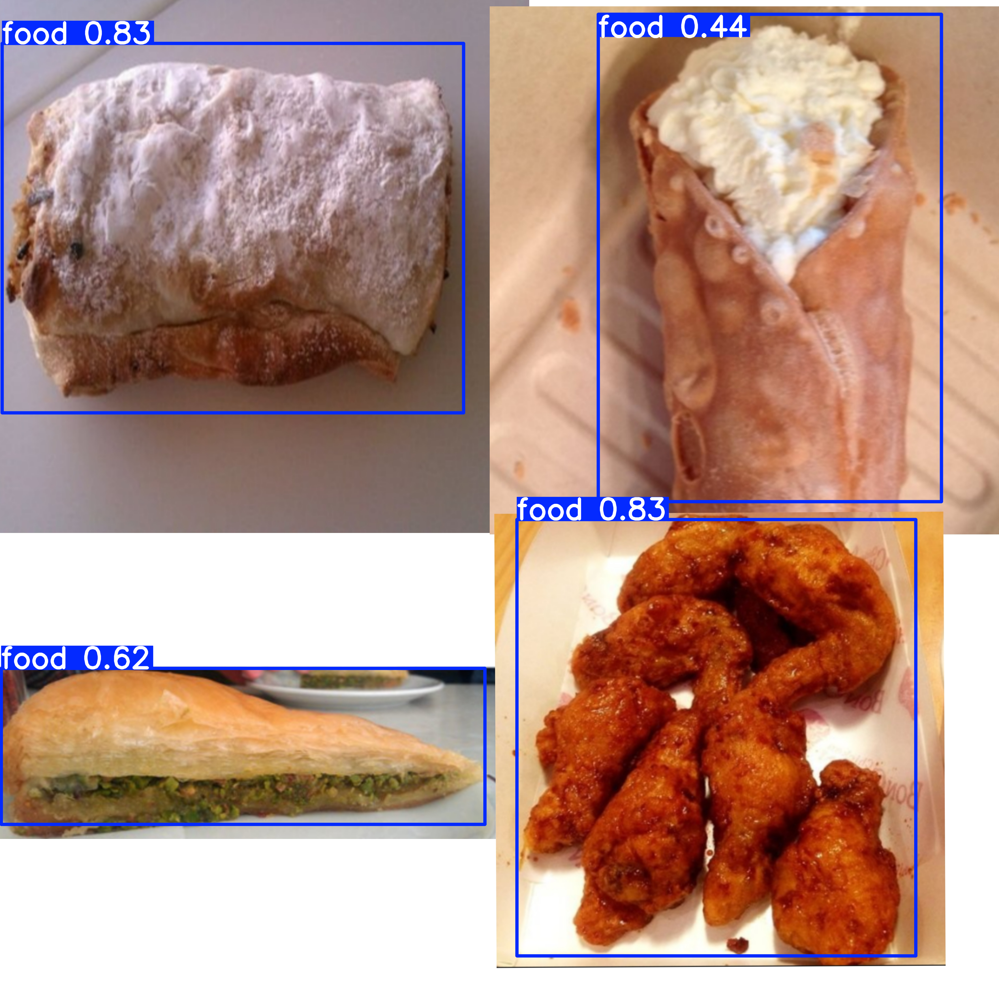

In [ ]:
from google.colab.patches import cv2_imshow

yolo_result = results[0].plot()

cv2_imshow(yolo_result)

In [ ]:
print("Number of detections:", len(boxes))
print(boxes)

Number of detections: 4
[[     1792.1      1801.2      3175.9      3314.8]
 [     7.3728      150.41      1607.4      1431.3]
 [       4.82      2317.6      1681.6      2858.8]
 [     2074.8      49.919      3264.7      1739.7]]


In [ ]:
def classify_food(crop):

    crop = Image.fromarray(crop)
    input_tensor = transform(crop).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = vit_model(input_tensor)

        if hasattr(outputs, "logits"):
            outputs = outputs.logits

    pred_index = torch.argmax(outputs, dim=1).item()

    label = CLASS_NAMES[pred_index]

    return label

In [ ]:
labels = []

for box, conf in zip(boxes, confidences):

    if conf < 0.4:
        continue

    x1, y1, x2, y2 = map(int, box)

    crop = image_rgb[y1:y2, x1:x2]

    label = classify_food(crop)

    labels.append((x1,y1,x2,y2,label))

In [ ]:
print(labels)

[(1792, 1801, 3175, 3314, 'chicken_wings'), (7, 150, 1607, 1431, 'croque_madame'), (4, 2317, 1681, 2858, 'baklava'), (2074, 49, 3264, 1739, 'cannoli')]
